In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
import cufflinks
import plotly
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
%matplotlib inline

In [10]:
league_19 = pd.read_csv("data/season-1819_csv.csv")
league_18 = pd.read_csv("data/season-1718_csv.csv")
league_17 = pd.read_csv("data/season-1617_csv.csv")
league_16 = pd.read_csv("data/season-1516_csv.csv")
league_15 = pd.read_csv("data/season-1415_csv.csv")
league_14 = pd.read_csv("data/season-1314_csv.csv")
league_13 = pd.read_csv("data/season-1213_csv.csv")
league_12 = pd.read_csv("data/season-1112_csv.csv")
league_11 = pd.read_csv("data/season-1011_csv.csv")
league_10 = pd.read_csv("data/season-0910_csv.csv")
team_info = pd.read_csv("data/team_locs.csv")
full_df = pd.read_csv("data/full.csv")

In [11]:
leagues = [league_10, league_11, league_12, league_13, league_14, league_15, league_16, 
           league_17, league_18, league_19]

In [12]:
league_10.head()

,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,Referee,...,AST,HF,AF,HC,AC,HY,AY,HR,AR,Location
0,2009-08-15,Aston Villa,Wigan,0,2,A,0,1,A,M Clattenburg,...,7,15,14,4,6,2,2,0,0,Birmingham
1,2009-08-15,Blackburn,Man City,0,2,A,0,1,A,M Dean,...,5,12,9,5,4,2,1,0,0,Lancashire
2,2009-08-15,Bolton,Sunderland,0,1,A,0,1,A,A Marriner,...,13,16,10,4,7,2,1,0,0,Greater Manchester
3,2009-08-15,Chelsea,Hull,2,1,H,1,1,D,A Wiley,...,3,13,15,12,4,1,2,0,0,London
4,2009-08-15,Everton,Arsenal,1,6,A,0,3,A,M Halsey,...,9,11,13,4,9,0,0,0,0,Merseyside


In [13]:
# for lge in leagues:
#     lge.loc[:, "Date"] = pd.to_datetime(lge.Date)

In [14]:
# teams = set()
# for league in leagues:
#     temp = league.HomeTeam.unique()
#     for team in temp:
#         teams.add(team)

## Some feature engineering

In [15]:
# team_latitude = {"Arsenal": 51.5074, "Aston Villa": 52.4960, "Birmingham": 52.4862, "Blackburn": 53.7486, 
#                  "Blackpool": 53.8175, "Bolton": 53.5769, "Bournemouth": 50.7192, "Brighton": 50.8225, 
#                  "Burnley": 53.7893, "Cardiff": 51.4816, "Chelsea": 51.4773, "Crystal Palace": 51.3988, 
#                  "Everton": 53.4084, "Fulham": 51.4773, "Huddersfield": 53.6458, "Hull": 53.7676, 
#                  "Leicester": 52.6369, "Liverpool": 53.4084, "Man City": 53.4808, "Man United": 53.4808, 
#                  "Middlesbrough": 54.5742, "Newcastle": 54.9783, "Norwich": 52.6309, "Portsmouth": 50.8198, 
#                  "QPR": 51.5134, "Reading": 51.4543, "Southampton": 50.9097, "Stoke": 53.0027, 
#                  "Sunderland": 54.9069, "Swansea": 51.6214,"Tottenham": 51.6056, "Watford": 51.6565, 
#                  "West Brom": 52.5177, "West Ham": 51.5472, "Wigan": 53.5451, "Wolves": 52.5870}

# team_longitude = {"Arsenal": 0.1278, "Aston Villa": 1.8853, "Birmingham": 1.8904, "Blackburn": 2.4875, 
#                   "Blackpool": 3.0357, "Bolton": 2.4282, "Bournemouth": 1.8808, "Brighton": 0.1372, 
#                   "Burnley": 2.2405, "Cardiff": 3.1791, "Chelsea": 0.2017, "Crystal Palace": 0.0855, 
#                   "Everton": 2.9916, "Fulham": 0.2017, "Huddersfield": 1.7850, "Hull": 0.3274, 
#                   "Leicester": 1.1398, "Liverpool": 2.9916, "Man City": 2.2426, "Man United": 2.2426, 
#                   "Middlesbrough": 1.2350, "Newcastle": 1.6178, "Norwich": 1.2974, "Portsmouth": 1.0880, 
#                   "QPR": 0.2323, "Reading": 0.9781, "Southampton": 1.4044, "Stoke": 2.1794, 
#                   "Sunderland": 1.3838, "Swansea": 3.9436, "Tottenham": 0.0682, "Watford": 0.3903, 
#                   "West Brom": 1.9952, "West Ham": 0.0081, "Wigan": 2.6325, "Wolves": 2.1288}

In [16]:
team_locs = {"Arsenal": "London", "Aston Villa": "Birmingham", "Birmingham": "Birmingham", 
             "Blackburn": "Lancashire", "Blackpool": "Lancashire", 
             "Bolton": "Greater Manchester", "Bournemouth": "Dorset", 
             "Brighton": "East Sussex", "Burnley": "Lancashire", "Cardiff": "East Wales", 
             "Chelsea": "London", "Crystal Palace": "London", 
             "Everton": "Merseyside", "Fulham": "London", "Huddersfield": "West Yorkshire", 
             "Hull": "Lincolnshire", "Leicester": "Leicester", "Liverpool": "Merseyside", 
             "Man City": "Greater Manchester", "Man United": "Greater Manchester", 
             "Middlesbrough": "North Yorkshire", "Newcastle": "Northumberland", 
             "Norwich": "East Angalia", "Portsmouth": "Isle of Wight", "QPR": "London", 
             "Reading": "Berkshire", "Southampton": "Isle of Wight", 
             "Stoke": "Shropshire", "Sunderland": "Northumberland", 
             "Swansea": "Swansea", "Tottenham": "London", "Watford": "Hertfordshire", 
             "West Brom": "West Midlands", "West Ham": "London", 
             "Wigan": "Greater Manchester", "Wolves": "West Midlands", "Leeds United": "West Yorkshire", 
             "Preston North End": "Lancashire", "Luton Town": "Bedfordshire", "Ipswich Town": "Suffolk", 
             "Derby": "Derbyshire", "Millwall": "London", "Aldershot Town": "Hampshire"}

## Some team specific data

In [9]:
# for league in leagues:
#     league["Location"] = league["HomeTeam"].replace(team_locs)

In [10]:
# paths = ["data/season-0910_csv.csv",
#          "data/season-1011_csv.csv",
#          "data/season-1112_csv.csv",
#          "data/season-1213_csv.csv", 
#          "data/season-1314_csv.csv", 
#          "data/season-1415_csv.csv",
#          "data/season-1516_csv.csv", 
#          "data/season-1617_csv.csv", 
#          "data/season-1718_csv.csv", 
#          "data/season-1819_csv.csv"]
# for i in range(len(leagues)):
#     leagues[i].to_csv(paths[i], index=False)

In [11]:
# full_df = pd.concat(leagues)

In [12]:
# full_df.to_csv("data/full.csv", index=False)

# Season Performances

In [17]:
def points(df, team):
    """Get point count for a team."""
    
    points = np.zeros(df.shape[0])
    vals = df.values
    running_count = 0
    for row in range(len(vals)):
        if vals[row][1] == team and vals[row][5] == "H":
            running_count += 3
            points[row] = running_count
        elif vals[row][2] == team and vals[row][5] == "A":
            running_count += 3
            points[row] = running_count
        elif vals[row][1] == team and vals[row][5] == "D":
            running_count += 1
            points[row] = running_count
        elif vals[row][2] == team and vals[row][5] == "D":
            running_count += 1
            points[row] = running_count
        else:
            points[row] = running_count
    return points

In [18]:
def race(df):
    """Get season long progression of top four teams at the end of the season."""
    
    teams = df.HomeTeam.unique()
    index = pd.DataFrame(list(df.index), columns=["Index"]).set_index("Index")
    index["Date"] = df.Date
    team_info = []
    for team in teams:
        curr_team = df[(df.HomeTeam == team) | (df.AwayTeam == team)]
        curr_team[team + "_Points"] = points(curr_team, team)
        curr = curr_team[[team+"_Points"]]
        index = index.join(curr, how="left")
    for team in index.columns:
        curr_points = 0
        for row in range(len(index[team])):
            if index[team].iloc[row] != index[team].iloc[row]:
                index[team].iloc[row] = curr_points
                curr_points = index[team].iloc[row]
            else:
                curr_points = index[team].iloc[row]
    last_week = index.iloc[-1].drop("Date").sort_values(ascending=False)
    index = index.set_index("Date")
    return index

In [19]:
def race_top4(df):
    """Get season long progression of top four teams at the end of the season."""
    
    teams = df.HomeTeam.unique()
    index = pd.DataFrame(list(df.index), columns=["Index"]).set_index("Index")
    index["Date"] = df.Date
    team_info = []
    for team in teams:
        curr_team = df[(df.HomeTeam == team) | (df.AwayTeam == team)]
        curr_team[team + "_Points"] = points(curr_team, team)
        curr = curr_team[[team+"_Points"]]
        index = index.join(curr, how="left")
    for team in index.columns:
        curr_points = 0
        for row in range(len(index[team])):
            if index[team].iloc[row] != index[team].iloc[row]:
                index[team].iloc[row] = curr_points
                curr_points = index[team].iloc[row]
            else:
                curr_points = index[team].iloc[row]
    last_week = index.iloc[-1].drop("Date").sort_values(ascending=False)
    index = index.set_index("Date")
    top_4 = last_week.head(4).index
    top_4 = index[top_4]
    return top_4

## Track cumulative season-long performance

In [16]:
full = leagues[0]
for league in leagues[1:]:
    full = full.append(league)
full.reset_index(inplace=True)
full.drop(columns="index", inplace=True)

In [17]:
full = race(full)

In [18]:
full_traces = []
for team in full.columns:
    trace = go.Scatter(
        x=full[team].index, 
        y=full[team].values, 
        text=team, 
        name=team)
    full_traces.append(trace)

In [19]:
layout = go.Layout(
    title="10 years of English Premier League Points", 
    xaxis=dict(title="Date"), 
    yaxis=dict(title="Points"))

In [14]:
iplot(dict(data=full_traces, layout=layout))

In [383]:
races = [race_top4(df) for df in leagues]

In [389]:
traces = []
for year in races:
    year_traces = []
    for team in year.columns:
        trace = go.Scatter(
            x=year[team].index, 
            y=year[team].values, 
            text=team, 
            name=team)
        year_traces.append(trace)
    traces.append(year_traces)

In [390]:
years = ["2010", "2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019"]
for t in range(len(traces)):
    layout = go.Layout(
        title = years[t] + " Race For English Premier League Title",
        xaxis = dict(title = "Date"), 
        yaxis = dict(title = "Points"))
    fig = dict(data=traces[t], layout=layout)
    iplot(fig)

## Ideas:
 - Add 3 points for win, 1 point for draw, -3 for loss (this isn't how it works but could demonstrate team form better

# Referee Invesitigation

In [252]:
red = [league[["Referee", "HR", "AR"]].groupby("Referee").sum() for league in leagues]
yellow = [league[["Referee", "HY", "AY"]].groupby("Referee").sum() for league in leagues]

In [253]:
base_red = red[0]
for ref in red[1:]:
    base_red = base_red.join(ref, on="Referee", how="left", lsuffix="_left", rsuffix="_right")
base_yellow = yellow[0]
for ref in yellow[1:]:
    base_yellow = base_yellow.join(ref, on="Referee", how="left", lsuffix="_left", rsuffix="_right")

In [254]:
base_red.fillna(value=0, inplace=True)
base_yellow.fillna(value=0, inplace=True)

In [257]:
reds = base_red.sum(axis=1)
yellows = base_yellow.sum(axis=1)

In [259]:
reds.drop("Mn Atkinson", inplace=True)
yellows.drop("Mn Atkinson", inplace=True)

In [268]:
refs = pd.DataFrame(reds, columns=["Red_Cards"])

In [271]:
refs["Yellow_Cards"] = yellows

In [337]:
red_trace = go.Bar(
    x=refs.index,
    y=refs.Red_Cards,
    name='Red Cards',
    marker=dict(
        color='red')
)
yellow_trace = go.Bar(
    x=refs.index,
    y=refs.Yellow_Cards,
    name='Yellow Cards',
    marker=dict(
        color='yellow')
#     yaxis='y2'
)
traces = [yellow_trace, red_trace]

In [338]:
layout = go.Layout(
    title='Total Cards given per Referee',
    yaxis=dict(
        title='Cards',
        side='left'
    ),
#     yaxis2=dict(
#         title='Yellow Cards',
#         side='right',
#         overlaying='y'
#     ),
    xaxis=dict(
        title='Referee'),
    legend=dict(x=1, y=1.1),
    barmode='group',
    bargroupgap=0.1,
)

fig = go.Figure(data=traces, layout=layout)
iplot(fig, filename='grouped-bar')

In [276]:
refs.iplot(
    kind='bar',
    xTitle='Referee',
    yTitle='Total Red Cards',
    secondary_y='Yellow_Cards',
    secondary_y_title='Total Yellow Cards',
    title='Total Cards given per Referee',
    color=['red', 'yellow'], 
    opacity=0.8)

# More feature engineering

In [8]:
team_info.head()

,Team,Location,Latitude,Longitude,First Half Goals,Second Half Goals,Year Count,Titles,Points,Location Count
0,Arsenal,London,51.5074,0.1278,313,411,10,13,715.0,7
1,Aston Villa,Birmingham,52.4960,1.8853,141,140,7,7,284.0,2
2,Birmingham,Birmingham,52.4862,1.8904,32,43,2,0,89.0,2
3,Blackburn,Lancashire,53.7486,2.4875,63,72,3,3,124.0,3
4,Blackpool,Lancashire,53.8175,3.0357,28,27,1,0,39.0,3


## Find total first and second half goals per team

In [9]:
def first_or_second(stat_df, team_df):
    teams = team_df["Team"]
    first_half_goals = dict()
    second_half_goals = dict()
    for team in teams:
        home = stat_df[stat_df.HomeTeam==team]
        away = stat_df[stat_df.AwayTeam==team]
        first = np.sum(home.HTHG) + np.sum(away.HTAG)
        second = np.sum(home.FTHG) + np.sum(away.FTAG) - first
        first_half_goals[team] = first
        second_half_goals[team] = second
    return first_half_goals, second_half_goals

In [10]:
first, second = first_or_second(full_df, team_info)

In [11]:
team_info["First Half Goals"] = team_info.Team.replace(first)
team_info["Second Half Goals"] = team_info.Team.replace(second)

## Get total years in PL per team in the last 10 years

In [12]:
teams = full_df.HomeTeam.unique()

In [13]:
year_counts = dict()
for team in teams:
    years = 0
    for league in leagues:
        if team in league.HomeTeam.unique():
            years += 1
    year_counts[team] = years

In [14]:
team_info["Year Count"] = team_info.Team.replace(year_counts)

## Add total PL championships per team

In [15]:
team_title_wins = {"Arsenal": 13, "Aston Villa": 7, "Birmingham": 0, "Blackburn": 3, "Blackpool": 0, 
                   "Bolton": 0, "Bournemouth": 0, "Brighton": 0, "Burnley": 2, "Cardiff": 0, 
                   "Chelsea": 6, "Crystal Palace": 0, "Everton": 0, "Fulham": 0, "Huddersfield": 3, 
                   "Hull": 0, "Leicester": 1, "Liverpool": 18, "Man City": 5, "Man United": 20, 
                   "Middlesbrough": 0, "Newcastle": 4, "Norwich": 0, "Portsmouth": 2, "QPR": 0, 
                   "Reading": 0, "Southampton": 0, "Stoke": 0, "Sunderland": 6, "Swansea": 0, 
                   "Tottenham": 2, "Watford": 0, "West Brom": 1, "West Ham": 0, "Wigan": 0, "Wolves": 3}

In [16]:
team_info["Titles"] = team_info["Team"].replace(team_title_wins)

## Get cumulative points over 10 years per team

In [17]:
all_points = full.iloc[-1]
points = {key[:-7]:value for key, value in all_points.items()}
team_info["Points"] = team_info.Team.replace(points)

NameError: name 'full' is not defined

## Number of teams per region

In [ ]:
city_counts = team_info[["Location", "Team"]].groupby("Location").count()
loc_counts = dict()
for city in city_counts.values:
    loc_counts[city[0]] = city[1]

In [ ]:
loc_counts

In [18]:
team_info["Location Count"] = team_info.Location.replace(loc_counts)

NameError: name 'loc_counts' is not defined

In [19]:
team_info

,Team,Location,Latitude,Longitude,First Half Goals,Second Half Goals,Year Count,Titles,Points,Location Count
0,Arsenal,London,51.5074,0.1278,313,411,10,13,715.0,7
1,Aston Villa,Birmingham,52.4960,1.8853,141,140,7,7,284.0,2
2,Birmingham,Birmingham,52.4862,1.8904,32,43,2,0,89.0,2
3,Blackburn,Lancashire,53.7486,2.4875,63,72,3,3,124.0,3
4,Blackpool,Lancashire,53.8175,3.0357,28,27,1,0,39.0,3
5,Bolton,Greater Manchester,53.5769,2.4282,61,79,3,0,121.0,4
6,Bournemouth,Dorset,50.7192,1.8808,90,104,4,0,173.0,1
7,Brighton,East Sussex,50.8225,0.1372,32,34,2,0,74.0,1
8,Burnley,Lancashire,53.7893,2.2405,87,102,5,2,197.0,3
9,Cardiff,East Wales,51.4816,3.1791,19,43,2,0,61.0,1


In [25]:
team_info.drop(columns=["Latitude", "Longitude"], inplace=True)

In [26]:
team_info.to_csv("data/team_info.csv", index=False)

## Team rivals

In [27]:
rivals = {"Arsenal": "Chelsea", "Aston Villa": "Birmingham", "Birmingham": "Aston Villa", 
          "Blackburn": "Burnley", "Blackpool": "Preston North End", "Bolton": "Wigan", 
          "Bournemouth": "Southampton", "Brighton": "Crystal Palace", "Burnley": "Blackburn", 
          "Cardiff": "Swansea", "Chelsea": "Arsenal", "Crystal Palace": "Brighton", "Everton": "Liverpool", 
          "Fulham": "Chelsea", "Huddersfield": "Leeds United", "Hull": "Leeds United", "Leicester": "Derby", 
          "Liverpool": "Man United", "Man City": "Man United", "Man United": "Liverpool", 
          "Middlesbrough": "Sunderland", "Newcastle": "Sunderland", "Norwich": "Ipswich Town", 
          "Portsmouth": "Southampton", "QPR": "Chelsea", "Reading": "Aldershot Town", 
          "Southampton": "Portsmouth", "Stoke": "West Brom", "Sunderland": "Newcastle", 
          "Swansea": "Cardiff", "Tottenham": "Arsenal", "Watford": "Luton Town", "West Brom": "Aston Villa", 
          "West Ham": "Millwall", "Wigan": "Bolton", "Wolves": "West Brom"}

In [28]:
team_info["Rival"] = [rivals[team] for team in team_info.Team]
team_info["Rival Town"] = team_info.Rival.replace(team_locs)

In [29]:
team_info

,Team,Location,First Half Goals,Second Half Goals,Year Count,Titles,Points,Location Count,Rival,Rival Town
0,Arsenal,London,313,411,10,13,715.0,7,Chelsea,London
1,Aston Villa,Birmingham,141,140,7,7,284.0,2,Birmingham,Birmingham
2,Birmingham,Birmingham,32,43,2,0,89.0,2,Aston Villa,Birmingham
3,Blackburn,Lancashire,63,72,3,3,124.0,3,Burnley,Lancashire
4,Blackpool,Lancashire,28,27,1,0,39.0,3,Preston North End,Lancashire
5,Bolton,Greater Manchester,61,79,3,0,121.0,4,Wigan,Greater Manchester
6,Bournemouth,Dorset,90,104,4,0,173.0,1,Southampton,Isle of Wight
7,Brighton,East Sussex,32,34,2,0,74.0,1,Crystal Palace,London
8,Burnley,Lancashire,87,102,5,2,197.0,3,Blackburn,Lancashire
9,Cardiff,East Wales,19,43,2,0,61.0,1,Swansea,Swansea


# London rivalries

In [126]:
london = pd.DataFrame(columns=["Rival_ID", "Name", "Latitude", "Longitude"])

In [125]:
london_info = team_info[team_info.Location=="London"]

In [127]:
rival_ids = []
for i in range(7):
    rival_ids.append(i)
    rival_ids.append(i)
london.Rival_ID = rival_ids

In [130]:
names = []
for t in range(len(london_info)):
    names.append(london_info.Team.iloc[t])
    names.append(london_info.Rival.iloc[t])

In [132]:
london["Name"] = names

In [135]:
coords = {"Arsenal": (51.554664448, -0.10166626), "Chelsea": (51.4817, 0.1910), 
          "Crystal Palace": (51.392331764, -0.084666328), "Brighton": (50.8616, 0.0837), 
          "Fulham": (51.4749, 0.2218), "QPR": (51.5093, 0.2321), "Tottenham": (51.6043, 0.0664), 
          "West Ham": (51.5387, 0.0166), "Millwall": (51.4859, 0.0509)}
london["Latitude"] = [coords[team][0] for team in london.Name]
london["Longitude"] = [coords[team][1] for team in london.Name]

In [151]:
numRivals = london_info.Rival.value_counts()

In [152]:
num_rivals = {team[0]: team[1] for team in numRivals.items()}

In [153]:
london["Num Rivals"] = london.Name.replace(num_rivals)

In [156]:
def num_fix(x):
    if type(x) is str:
        return 0
    else:
        return x

In [158]:
london["Num Rivals"] = london["Num Rivals"].apply(num_fix)

In [160]:
london.to_csv("data/london.csv", index=False)

In [150]:
london_info

,Team,Location,First Half Goals,Second Half Goals,Year Count,Titles,Points,Location Count,Rival,Rival Town,Rival Path
0,Arsenal,London,313,411,10,13,715.0,7,Chelsea,London,London_London
10,Chelsea,London,331,390,10,6,745.0,7,Arsenal,London,London_London
11,Crystal Palace,London,93,164,6,0,262.0,7,Brighton,East Sussex,London_East Sussex
13,Fulham,London,102,157,6,0,245.0,7,Chelsea,London,London_London
24,QPR,London,48,67,3,0,92.0,7,Chelsea,London,London_London
30,Tottenham,London,277,383,10,2,706.0,7,Arsenal,London,London_London
33,West Ham,London,189,234,9,0,393.0,7,Millwall,London,London_London


# Second half goals ratio vs number of wins

In [31]:
home_sums = league_18[["HomeTeam", "HTHG", "FTHG"]].groupby("HomeTeam").sum()
away_sums = league_18[["AwayTeam", "HTAG", "FTAG"]].groupby("AwayTeam").sum()

In [38]:
home_sums.index.name = "Team"
away_sums.index.name = "Team"
home_sums.columns = ["HalfTime", "FullTime"]
away_sums.columns = ["HalfTime", "FullTime"]

In [41]:
full_sums = home_sums + away_sums
full_sums["SecondHalf"] = full_sums.loc[:, "FullTime"] - full_sums.loc[:, "HalfTime"]

In [44]:
full_sums.drop(columns="FullTime", inplace=True)

In [47]:
full_sums["Ratio"] = full_sums["SecondHalf"] / (full_sums["HalfTime"] + full_sums["SecondHalf"])

In [57]:
full_sums.reset_index(inplace=True)

In [50]:
def wins(df):
    teams = df.HomeTeam.unique()
    team_wins = dict()
    for team in teams:
        wins = 0
        for row in range(df.shape[0]):
            if df.HomeTeam.iloc[row] == team and df.FTHG.iloc[row] > df.FTAG.iloc[row]:
                wins += 1
            elif df.AwayTeam.iloc[row] == team and df.FTAG.iloc[row] > df.FTHG.iloc[row]:
                wins += 1
        team_wins[team] = wins
    return team_wins

In [52]:
team_wins = wins(league_18)

In [59]:
full_sums["Wins"] = full_sums.Team.replace(team_wins)

In [143]:
hover_text = [f"Team: {row[0]}<br>Wins: {row[1]}<br>First Half: {row[2]}<br>Second Half: {row[3]}" 
              for row in full_sums[["Team", "Wins", "HalfTime", "SecondHalf"]].values]

In [201]:
np.linspace(-1.5, 1.5, 20)

array([-1.5       , -1.34210526, -1.18421053, -1.02631579, -0.86842105,
       -0.71052632, -0.55263158, -0.39473684, -0.23684211, -0.07894737,
        0.07894737,  0.23684211,  0.39473684,  0.55263158,  0.71052632,
        0.86842105,  1.02631579,  1.18421053,  1.34210526,  1.5       ])

In [202]:
trace = [go.Scatter(
    x=full_sums["SecondHalf"]+np.random.choice(a=np.linspace(-1.5, 1.5, 20), size=20, replace=False), 
    y=full_sums["HalfTime"].values,
    text=hover_text,
    hoverinfo="text",
    mode="markers",
    marker=dict(
        size=full_sums["Wins"]**1.2,
        color="Green"))]

In [203]:
layout = go.Layout(
    title="Second Half Goals vs Wins for 2018 Season", 
    xaxis=dict(title="Second Half Goals"), 
    yaxis=dict(title="First Half Goals"))

In [204]:
iplot(dict(data=trace, layout=layout))

In [148]:
full_sums.to_csv("data/goals.csv", index=False)

# Stacked Area Graph

In [8]:
def points(df, team):
    """Get point count for a team."""
    
    df = df[(df.HomeTeam==team) | (df.AwayTeam==team)]
    vals = df.values
    points = np.zeros(df.shape[0])
    running_count = 0
    for row in range(len(vals)):
        if vals[row][1] == team and vals[row][5] == "H":
            running_count += 3
            points[row] = running_count
        elif vals[row][2] == team and vals[row][5] == "A":
            running_count += 3
            points[row] = running_count
        elif vals[row][1] == team and vals[row][5] == "D":
            running_count += 1
            points[row] = running_count
        elif vals[row][2] == team and vals[row][5] == "D":
            running_count += 1
            points[row] = running_count
        else:
            running_count += -3
            points[row] += running_count
    return points

In [9]:
def race_top4(df):
    """Get season long progression of top four teams at the end of the season."""
    
    teams = df.HomeTeam.unique()
    index = pd.DataFrame(list(df.index), columns=["Index"]).set_index("Index")
    index["Date"] = df.Date
    team_info = []
    for team in teams:
        curr_team = df[(df.HomeTeam == team) | (df.AwayTeam == team)]
        curr_team[team + "_Points"] = points(curr_team, team)
        curr = curr_team[[team+"_Points"]]
        index = index.join(curr, how="left")
    for team in index.columns:
        curr_points = 0
        for row in range(len(index[team])):
            if index[team].iloc[row] != index[team].iloc[row]:
                index[team].iloc[row] = curr_points
                curr_points = index[team].iloc[row]
            else:
                curr_points = index[team].iloc[row]
    last_week = index.iloc[-1].drop("Date").sort_values(ascending=False)
    index = index.set_index("Date")
    top_4 = last_week.head(4).index
    top_4 = index[top_4]
    return top_4

In [10]:
top4 = race_top4(league_10)

In [18]:
top4.head()

,Chelsea_Points,Man United_Points,Arsenal_Points,Man City_Points
Date,,,,
2009-08-15,0.0,0.0,0.0,0.0
2009-08-15,0.0,0.0,0.0,3.0
2009-08-15,0.0,0.0,0.0,3.0
2009-08-15,3.0,0.0,0.0,3.0
2009-08-15,3.0,0.0,3.0,3.0


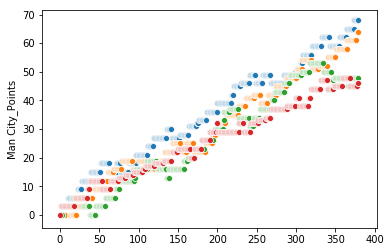

In [12]:
for team in top4.columns:
    sns.scatterplot(
        data=top4,
        x=range(top4.shape[0]),
        y=top4[team])

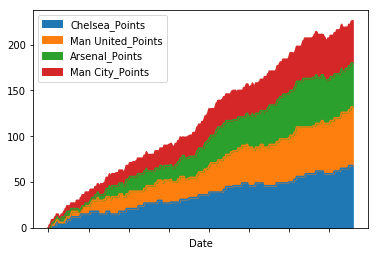

In [15]:
top4.plot.area()

In [16]:
top4.to_csv("data/top4.csv", index=False)

# Prep chloropleth

In [20]:
race_13 = race(league_13)

In [21]:
final_day = race_13.iloc[-1]

In [22]:
final_day

Arsenal_Points        73.0
Fulham_Points         43.0
Newcastle_Points      41.0
QPR_Points            25.0
Reading_Points        28.0
West Brom_Points      49.0
West Ham_Points       46.0
Man City_Points       78.0
Wigan_Points          36.0
Everton_Points        63.0
Chelsea_Points        75.0
Aston Villa_Points    41.0
Man United_Points     89.0
Norwich_Points        44.0
Southampton_Points    41.0
Swansea_Points        46.0
Tottenham_Points      72.0
Liverpool_Points      61.0
Stoke_Points          42.0
Sunderland_Points     39.0
Name: 2013-05-19, dtype: float64

In [23]:
champions = np.argmax(final_day)
champ_points = final_day[champions]

In [16]:
teams = league_13.HomeTeam.unique()
final_day_df = pd.DataFrame(teams, columns=["Team"])

In [18]:
point_diffs = champ_points - final_day

In [23]:
final_day_df["Final Point Difference"] = point_diffs.values

In [26]:
final_day_df["Location"] = final_day_df.Team.replace(team_locs)

In [33]:
final_day_df.drop(index=12, inplace=True) # remove league winners

In [36]:
final_day_df.reset_index(inplace=True)

In [38]:
final_day_df

,index,Team,Final Point Difference,Location
0,0,Arsenal,16.0,London
1,1,Fulham,46.0,London
2,2,Newcastle,48.0,Northumberland
3,3,QPR,64.0,London
4,4,Reading,61.0,Berkshire
5,5,West Brom,40.0,West Midlands
6,6,West Ham,43.0,London
7,7,Man City,11.0,Greater Manchester
8,8,Wigan,53.0,Greater Manchester
9,9,Everton,26.0,Merseyside


In [37]:
final_day_df.to_csv("data/final_day.csv", index=False)

# Heat Map
What months are most goals scored?

In [61]:
for i in range(len(leagues)):
    leagues[i]["Month"] = pd.DatetimeIndex(leagues[i].Date).month
    leagues[i]["Season"] = np.repeat(10+i, len(leagues[i]))

In [62]:
full = league_10
for league in leagues[1:]:
    full = full.append(league)

In [98]:
monthly_goals = full[["Month", "Season", "FTHG", "FTAG"]].groupby(["Season", "Month"]).sum()

In [99]:
monthly_goals["Goals"] = monthly_goals["FTHG"] + monthly_goals["FTAG"]

In [100]:
monthly_goals.drop(columns=["FTHG", "FTAG"], inplace=True)

In [101]:
monthly_goals = monthly_goals.reset_index()

In [102]:
month_means = monthly_goals[["Month", "Goals"]].groupby("Month").mean()

In [114]:
may_mean = month_means.iloc[4]
monthly_goals.loc[99] = [19, 5, int(may_mean.values[0])]

In [115]:
goals_pivot = monthly_goals.pivot("Season", "Month", "Goals")

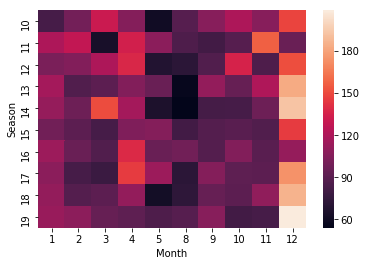

In [117]:
sns.heatmap(goals_pivot)

In [118]:
goals_pivot

Month,1,2,3,4,5,8,9,10,11,12
Season,,,,,,,,,,
10,83,100,131,106,61,89,107,120,107,149
11,120,128,64,134,108,86,81,89,157,96
12,102,105,120,138,68,72,87,136,86,152
13,117,87,91,105,96,57,111,95,121,183
14,112,97,151,117,66,54,82,83,97,193
15,99,91,83,104,106,81,88,90,87,146
16,114,96,87,139,96,99,88,105,90,112
17,108,83,78,146,114,72,106,92,91,174
18,111,88,91,111,62,73,95,91,110,186
